In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as mpl
import matplotlib.patches as mpa
import astropy.wcs as pywcs
from astropy.io import fits as pyfits
import scipy.ndimage as snd


from astropy.utils.data import get_pkg_data_filename
#import subprocess as sp
#from astropy.table import Table, hstack, join, Column
#import sys
#import os

from astropy.io import ascii
#import urllib


# from astropy.utils.data import get_pkg_data_filename
# import subprocess as sp
import glob
# from astropy.table import Table, hstack, join
# import sys
# import os
# from astropy.io import ascii
# from astropy.table import Column

In [2]:
#Bruno's code to get outlines of fields
# coding: utf-8

def create_footprint(data,header, debug=False):
    imgMask = np.zeros_like(data)
    smoothData = snd.gaussian_filter(data,sigma=2) # to smooth over artifacts
    imgMask[smoothData!=0] = 1 # mask non-zero pixels
    if debug is True:
        fig,ax = mpl.subplots(figsize=(18,16))
        ax.imshow(smoothData,vmin=0,vmax=0.5)
        cntr = ax.contour(imgMask,levels=[0.5],zorder=10,colors="white")
    else:
        cntr = mpl.contour(imgMask,levels=[0.5]) # contour separating 0 and 1 pixels
        mpl.close("all")
    dataSegments = cntr.allsegs
    
    sky_coords_all = []
    
    for i in range(len(dataSegments[0])):
        polygon = dataSegments[0][i] # get contour pixel coordinates
        wcs = pywcs.WCS(header)
        sky_coords = wcs.all_pix2world(polygon,1) # transform pixel to sky coordinates
        sky_coords_all.append(sky_coords)
    return sky_coords_all



#amended code

def select_object_segmap(segmap,index):
    Regions = np.zeros_like(segmap)
    if index not in segmap:
        raise ValueError('index not in segmentation map')
    #print(np.where(segmap==index))
    Regions[segmap==index]=index
    return Regions

#brunos code
def create_mask(filter,star_table):
    masterdata = ascii.read('/run/media/rowland/PURPLEDRIVE/mastertable')
    segmap_file = pyfits.open('/run/media/rowland/PURPLEDRIVE/segmaps_check/{}_check.fits'.format(filter))#[0].data
    segmap = segmap_file[0].data    

    regions = np.zeros_like(segmap)
    for detection in star_table:
        index = detection['NUMBER'.format(filter)]
        if isinstance(index,np.int64):
            regions += select_object_segmap(segmap,index)
    return segmap,regions 

In [3]:
#if needed

masterdata = ascii.read('/run/media/rowland/PURPLEDRIVE/mastertable')
#masterdata

# segmentation map - all detections & dilated mask

In [4]:
# plt.figure(figsize=(10,10))
# plt.imshow(segmapTEST,vmin=0,vmax=.7)
# plt.savefig('/data1/rowland/Figures/segmapforpresentation')

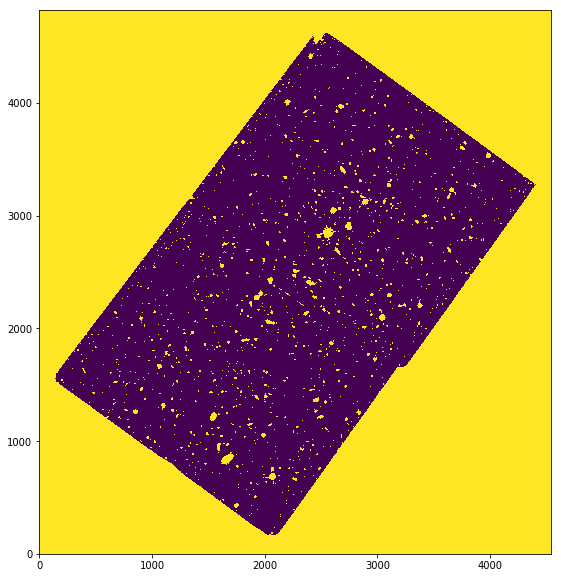

In [3]:
########################################
testfilter='F105W'
######################################
dilatedmask=pyfits.getdata('/data1/rowland/{}/dilated_mask_{}.fits'.format(testfilter,testfilter)) 

mpl.figure(figsize=(10,10))
mpl.imshow(dilatedmask,vmin=0,vmax=.7)
#mpl.savefig('/data1/rowland/Figures/dilatedMASKforpresentation',overwrite=True)

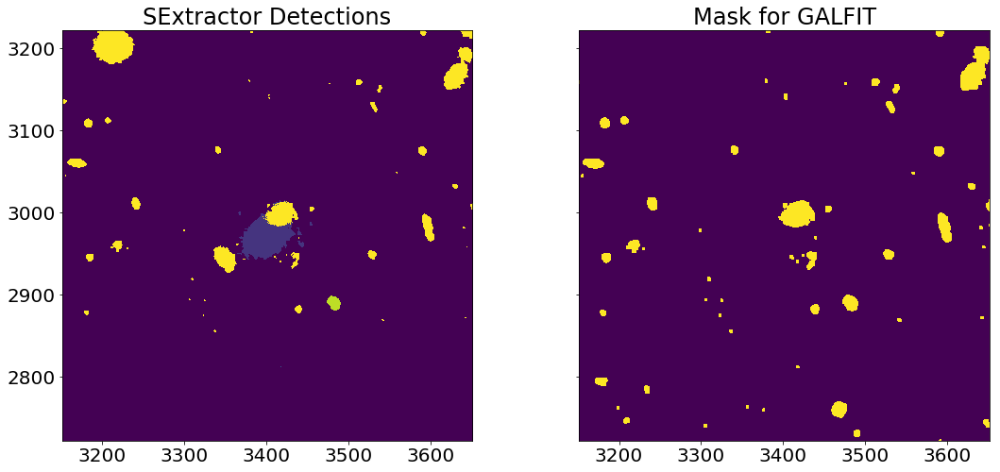

In [14]:

#shows how mask blocks all everything but the cluster galaxies



F105dilated_mask = pyfits.open('/run/media/rowland/PURPLEDRIVE/F105W/dilated_mask.fits')[0].data
segmapF105 = pyfits.open('/run/media/rowland/PURPLEDRIVE/segmaps_check/F105W_check.fits')[0].data

x = masterdata['X_IMAGE_F105'][35]#this indexing includes masked detections
y = masterdata['Y_IMAGE_F105'][35]#so index 35 is really detection 30




mpl.rcParams.update({'font.size': 20})

fig, axis = mpl.subplots(1,2,figsize=(18,8),sharex=True,sharey=True)
axis[0].imshow(segmapF105,vmin=1500,vmax=1540)#1506
axis[0].set_title('SExtractor Detections')
axis[1].imshow(F105dilated_mask,vmin=0,vmax=1)
axis[1].set_title('Mask for GALFIT')

for ax in axis:
    #ax.plot(xc, yc, "+",ms=20,mew=3) #plots last run detected object
    
    w = 250
    ax.set_xlim(x-w,x+w)
    ax.set_ylim(y-w,y+w)
mpl.savefig('/data1/rowland/Figures/howmaskworks',overwrite=True)

# Footprints

/data1/rowland/all_fits_data/hst_14096_i2_wfc3_ir_f160w_drz.fits
<class 'list'> (1, 8331, 2) [array([[ 15.71091727, -49.27446724],
       [ 15.71087895, -49.27446724],
       [ 15.71084064, -49.27446724],
       ...,
       [ 15.71093644, -49.27442974],
       [ 15.71093643, -49.27445474],
       [ 15.71091727, -49.27446724]])]


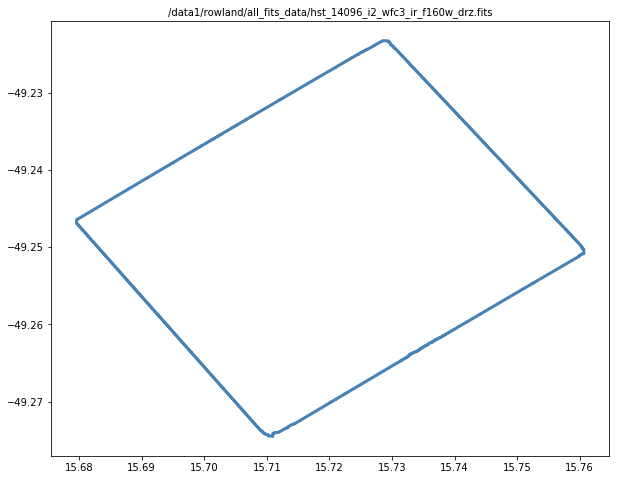

In [3]:
#input data

all_filter_files = glob.glob('/data1/rowland/all_fits_data/hst*_f*.fits') 

FIG, AX = mpl.subplots()

for image in all_filter_files:
    print(image)

    imgname = image #"ElGordoTest_F160W.fits" # name of image to get footprint
    img = pyfits.open(imgname)
    imgHeader = img['SCI'].header
    imgData = img['SCI'].data
    #imgHeader = pyfits.getheader(imgname)
    #imgData = pyfits.getdata(imgname)
    #print(imgname, imgHeader, imgData) #its picking the first index [sci,wht,ctx,exp]
    sky_coords = create_footprint(imgData,imgHeader,debug = False)
    img.close()
    print(type(sky_coords),np.shape(sky_coords),sky_coords)
    fig,ax = mpl.subplots(figsize=(10,8))
    for i in range(len(sky_coords)):
        ax.plot(sky_coords[i][:,0],sky_coords[i][:,1],"-",color="SteelBlue",lw=3)
        ax.set_title(imgname,fontsize=10)
        AX.plot(sky_coords[i][:,0],sky_coords[i][:,1],"-")
    break

# Subtracted Elgordos

In [ ]:
#to plot one at a time and tweek vmin/vmax

filters = ['F105W','F125W','F140W','F160W','F435W','F606W','F625W','F775W','F814W','F850LP'] #['F435W'] #

f, axes = mpl.subplots(len(filters),2,sharey=True,figsize=(35,35))

for i,filter in enumerate(filters):
    originalimage = pyfits.getdata('/data1/rowland/elgordo_{}.fits'.format(filter))
    backgrounds = pyfits.getdata('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))#.data
    mpl.rcParams.update({'font.size': 25})
    axes[i,0].imshow(originalimage,vmin=0,vmax=0.02) #elgordo
    axes[i,0].title.set_text('Original Image {}'.format(filter))
    axes[i,1].imshow(backgrounds,vmin=0,vmax=0.02)#residuals
    axes[i,1].title.set_text('Subtracted Image {}'.format(filter))

f.savefig('/data1/rowland/Figures/threefigs_ALLfilters',overwrite=True)

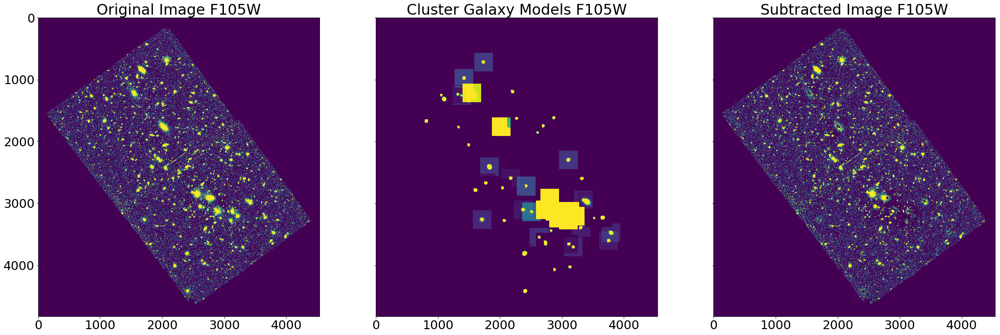

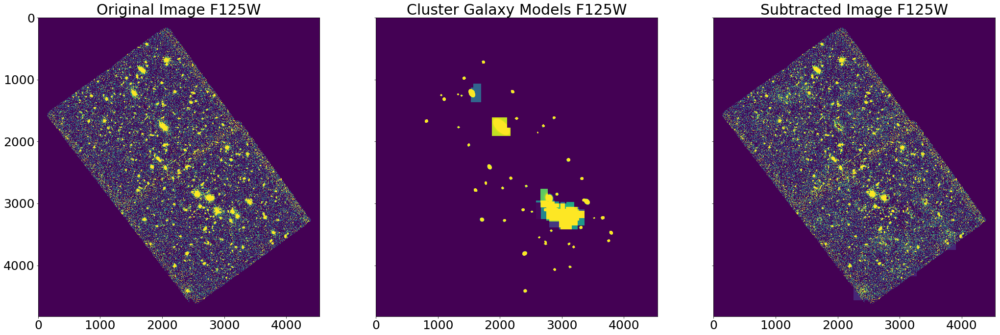

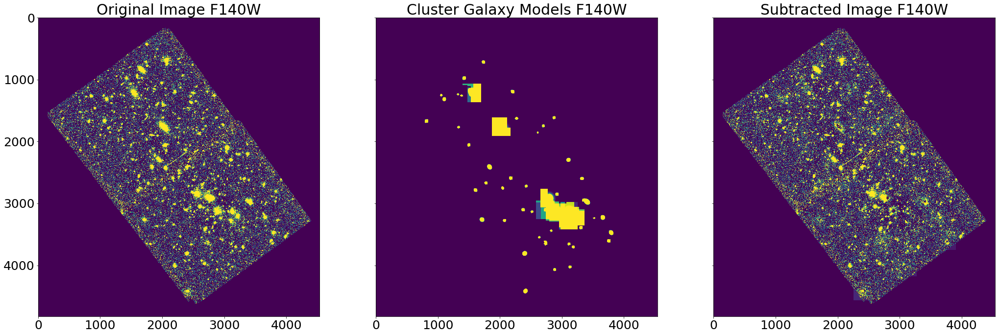

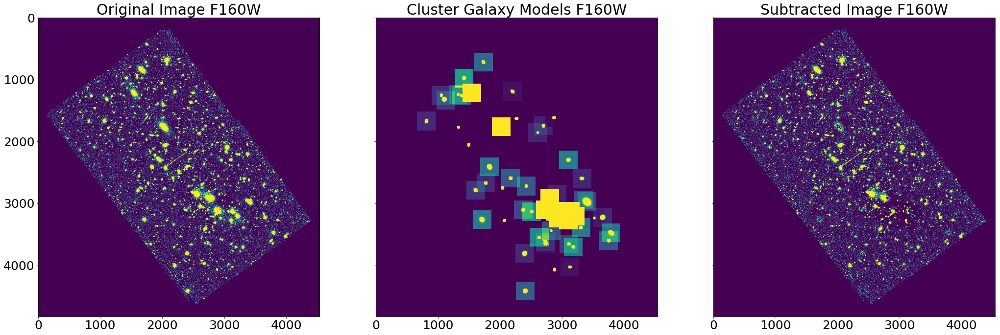

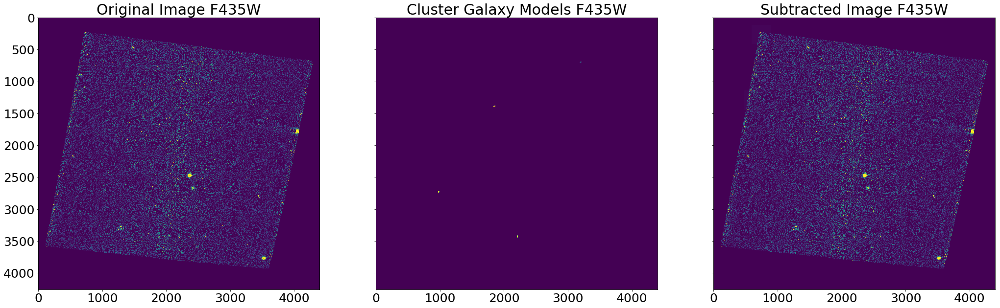

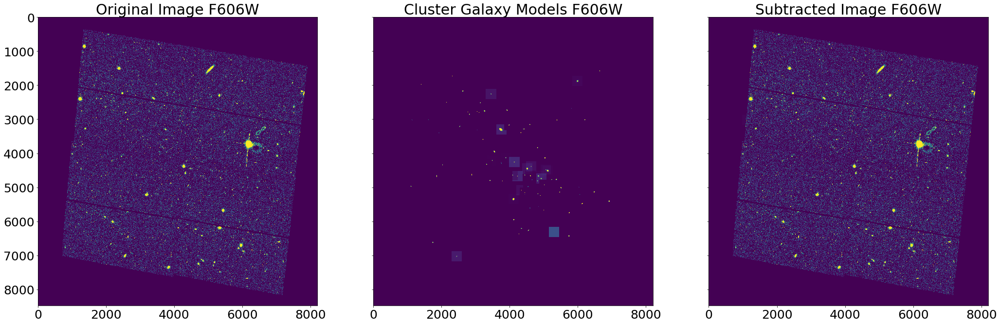

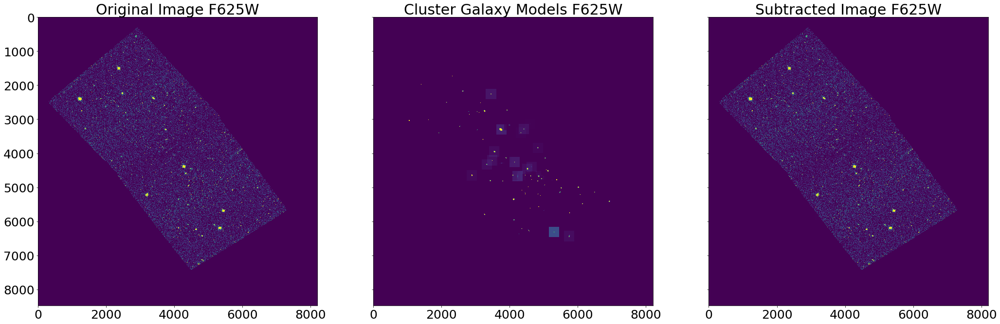

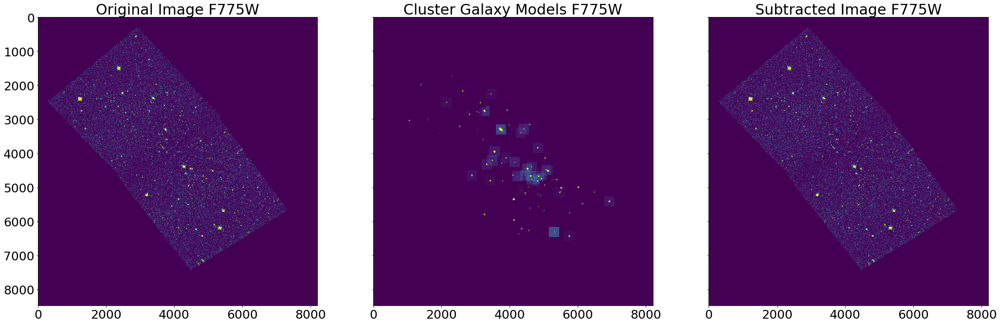

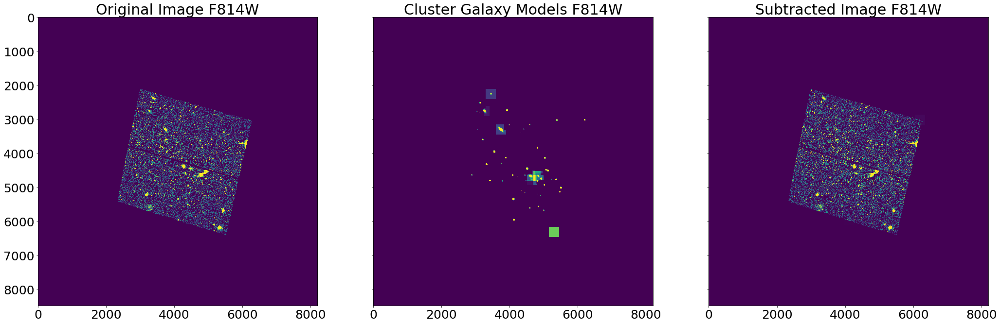

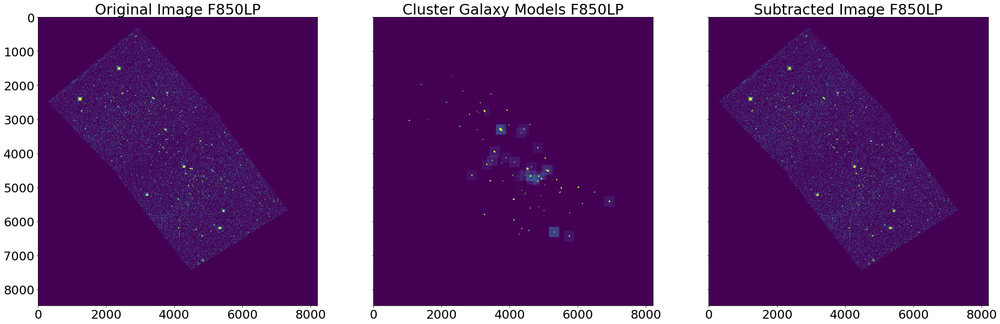

In [2]:
#to plot one at a time and tweek vmin/vmax

filters = ['F105W','F125W','F140W','F160W','F435W','F606W','F625W','F775W','F814W','F850LP'] #['F435W'] #


for filter in filters:
    originalimage = pyfits.getdata('/data1/rowland/elgordo_{}.fits'.format(filter))
    emptyfield = pyfits.getdata('/data1/rowland/models_elgordo{}'.format(filter))#.data
    backgrounds = pyfits.getdata('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))#.data
    mpl.rcParams.update({'font.size': 25})
    f, (ax1,ax2,ax3) = mpl.subplots(1,3,sharey=True,figsize=(35,35))
    ax1.imshow(originalimage,vmin=0,vmax=0.02) #elgordo
    ax1.title.set_text('Original Image {}'.format(filter),)
    ax2.imshow(emptyfield,vmin=0,vmax=0.002)#subtracted galaxies
    ax2.title.set_text('Cluster Galaxy Models {}'.format(filter))
    ax3.imshow(backgrounds,vmin=0,vmax=0.02)#residuals
    ax3.title.set_text('Subtracted Image {}'.format(filter))
    mpl.savefig('/data1/rowland/Figures/threefigs_{}'.format(filter),overwrite=True)
    #f.savefig('/data1/rowland/Figures/threefigs_ALLfilters',overwrite=True)

In [20]:
#takes soo long to run...just do indiviually above, its way faster

#doing first half of filters so runs faster


# filters = ['F105W','F125W','F140W','F160W','F435W'] #,'F606W','F625W','F775W','F814W','F850LP']

# for filter in filters:
#     originalimage = get_pkg_data_filename('/data1/rowland/elgordo_{}.fits'.format(filter))
#     original_image_data = pyfits.getdata(originalimage)
#     emptyfield = get_pkg_data_filename('/data1/rowland/models_elgordo{}'.format(filter))
#     emptyfields = pyfits.getdata(emptyfield)
#     backgrounds = get_pkg_data_filename('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))
#     background = pyfits.getdata(backgrounds)
#     f, (ax1,ax2,ax3) = mpl.subplots(1,3,sharey=True,figsize=(35,35))
#     ax1.imshow(original_image_data,vmin=0,vmax=0.2) #elgordo
#     ax1.title.set_text('Original Image')
#     ax2.imshow(emptyfields,vmin=0,vmax=0.2)#subtracted galaxies
#     ax2.title.set_text('Cluster Galaxy Models')
#     ax3.imshow(background,vmin=0,vmax=0.2)#residuals
#     ax3.title.set_text('Subtracted Image')

# INDIVIDUAL plots per filter

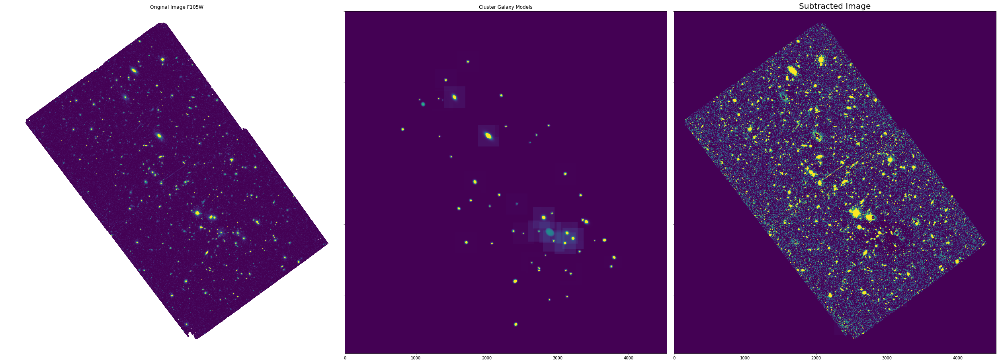

In [11]:


filters = ['F105W']#,'F125W','F140W','F160W','F435W','F606W','F625W','F775W','F814W','F850LP']


for filter in filters:
    originalimage = get_pkg_data_filename('/data1/rowland/elgordo_{}.fits'.format(filter))
    original_image_data = pyfits.getdata(originalimage)
    emptyfield = get_pkg_data_filename('/data1/rowland/models_elgordo{}'.format(filter))
    emptyfields = pyfits.getdata(emptyfield)
    backgrounds = get_pkg_data_filename('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))
    background = pyfits.getdata(backgrounds)
    f, (ax1,ax2,ax3) = mpl.subplots(1,3,sharey=True,figsize=(35,35))
    ax1.imshow(np.ma.masked_where(original_image_data==0,original_image_data),vmin=0,vmax=0.2) #elgordo
    ax1.title.set_text('Original Image {}'.format(filter))
    ax2.imshow(emptyfields,vmin=0,vmax=.05)#subtracted galaxies
    ax2.title.set_text('Cluster Galaxy Models')
    ax3.imshow(background,vmin=0,vmax=.02)#residuals
    ax3.set_title('Subtracted Image',fontsize=20)
    
    
ax1.axis("off")
f.tight_layout()

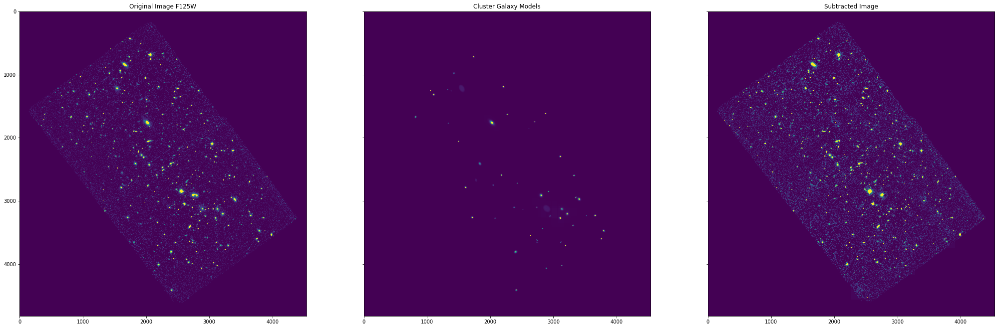

In [15]:
filters = ['F125W']#,'F140W','F160W','F435W','F606W','F625W','F775W','F814W','F850LP']
for filter in filters:
    originalimage = get_pkg_data_filename('/data1/rowland/elgordo_{}.fits'.format(filter))
    original_image_data = pyfits.getdata(originalimage)
    emptyfield = get_pkg_data_filename('/data1/rowland/models_elgordo{}'.format(filter))
    emptyfields = pyfits.getdata(emptyfield)
    backgrounds = get_pkg_data_filename('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))
    background = pyfits.getdata(backgrounds)
    f, (ax1,ax2,ax3) = mpl.subplots(1,3,sharey=True,figsize=(35,35))
    ax1.imshow(original_image_data,vmin=0,vmax=0.2) #elgordo
    ax1.title.set_text('Original Image {}'.format(filter))
    ax2.imshow(emptyfields,vmin=0,vmax=.5)#subtracted galaxies
    ax2.title.set_text('Cluster Galaxy Models')
    ax3.imshow(background,vmin=0,vmax=0.12)#residuals
    ax3.title.set_text('Subtracted Image')

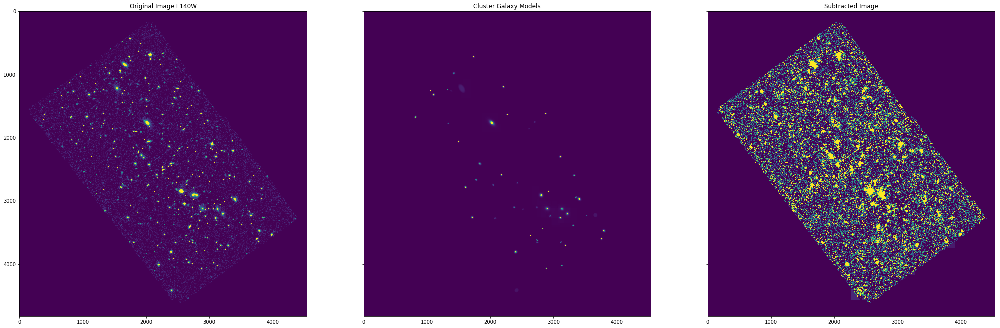

In [17]:
filters = ['F140W']#,'F160W','F435W','F606W','F625W','F775W','F814W','F850LP']
for filter in filters:
    originalimage = get_pkg_data_filename('/data1/rowland/elgordo_{}.fits'.format(filter))
    original_image_data = pyfits.getdata(originalimage)
    emptyfield = get_pkg_data_filename('/data1/rowland/models_elgordo{}'.format(filter))
    emptyfields = pyfits.getdata(emptyfield)
    backgrounds = get_pkg_data_filename('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))
    background = pyfits.getdata(backgrounds)
    f, (ax1,ax2,ax3) = mpl.subplots(1,3,sharey=True,figsize=(35,35))
    ax1.imshow(original_image_data,vmin=0,vmax=0.2) #elgordo
    ax1.title.set_text('Original Image {}'.format(filter))
    ax2.imshow(emptyfields,vmin=0,vmax=.5)#subtracted galaxies
    ax2.title.set_text('Cluster Galaxy Models')
    ax3.imshow(background,vmin=0,vmax=.02)#residuals
    ax3.title.set_text('Subtracted Image')

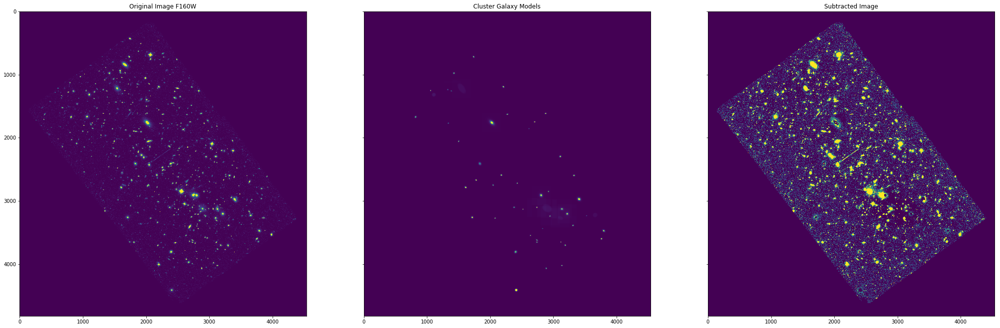

In [18]:
filters = ['F160W']#,'F435W','F606W','F625W','F775W','F814W','F850LP']
for filter in filters:
    originalimage = get_pkg_data_filename('/data1/rowland/elgordo_{}.fits'.format(filter))
    original_image_data = pyfits.getdata(originalimage)
    emptyfield = get_pkg_data_filename('/data1/rowland/models_elgordo{}'.format(filter))
    emptyfields = pyfits.getdata(emptyfield)
    backgrounds = get_pkg_data_filename('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))
    background = pyfits.getdata(backgrounds)
    f, (ax1,ax2,ax3) = mpl.subplots(1,3,sharey=True,figsize=(35,35))
    ax1.imshow(original_image_data,vmin=0,vmax=0.2) #elgordo
    ax1.title.set_text('Original Image {}'.format(filter))
    ax2.imshow(emptyfields,vmin=0,vmax=.5)#subtracted galaxies
    ax2.title.set_text('Cluster Galaxy Models')
    ax3.imshow(background,vmin=0,vmax=.02)#residuals
    ax3.title.set_text('Subtracted Image')

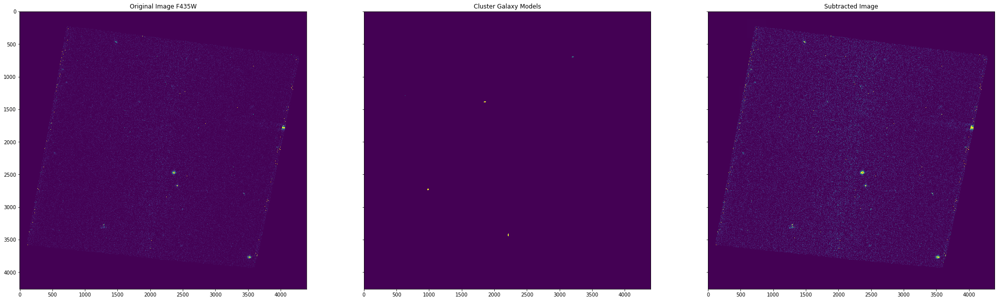

In [18]:
filters = ['F435W']#,'F606W','F625W','F775W','F814W','F850LP']
for filter in filters:
    originalimage = get_pkg_data_filename('/data1/rowland/elgordo_{}.fits'.format(filter))
    original_image_data = pyfits.getdata(originalimage)
    emptyfield = get_pkg_data_filename('/data1/rowland/models_elgordo{}'.format(filter))
    emptyfields = pyfits.getdata(emptyfield)
    backgrounds = get_pkg_data_filename('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))
    background = pyfits.getdata(backgrounds)
    f, (ax1,ax2,ax3) = mpl.subplots(1,3,sharey=True,figsize=(35,35))
    ax1.imshow(original_image_data,vmin=0,vmax=0.1) #elgordo
    ax1.title.set_text('Original Image {}'.format(filter))
    ax2.imshow(emptyfields,vmin=0,vmax=.0015)#subtracted galaxies
    ax2.title.set_text('Cluster Galaxy Models')
    ax3.imshow(background,vmin=0,vmax=.05)#residuals
    ax3.title.set_text('Subtracted Image')

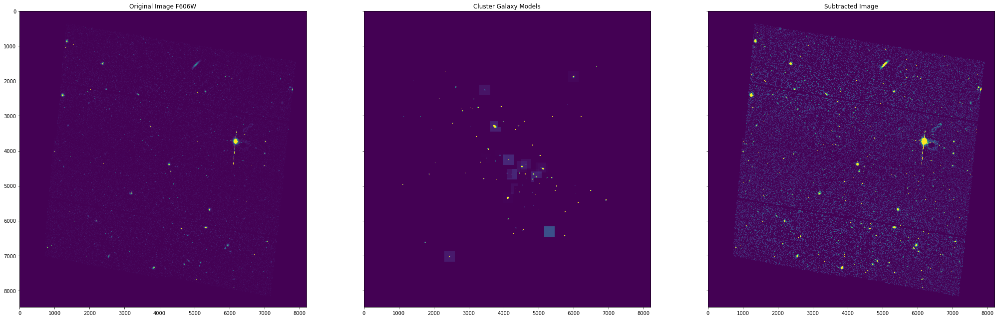

In [15]:
filters = ['F606W']#,'F625W','F775W','F814W','F850LP']
for filter in filters:
    originalimage = get_pkg_data_filename('/data1/rowland/elgordo_{}.fits'.format(filter))
    original_image_data = pyfits.getdata(originalimage)
    emptyfield = get_pkg_data_filename('/data1/rowland/models_elgordo{}'.format(filter))
    emptyfields = pyfits.getdata(emptyfield)
    backgrounds = get_pkg_data_filename('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))
    background = pyfits.getdata(backgrounds)
    f, (ax1,ax2,ax3) = mpl.subplots(1,3,sharey=True,figsize=(35,35))
    ax1.imshow(original_image_data,vmin=0,vmax=0.2) #elgordo
    ax1.title.set_text('Original Image {}'.format(filter))
    ax2.imshow(emptyfields,vmin=0,vmax=.002)#subtracted galaxies
    ax2.title.set_text('Cluster Galaxy Models')
    ax3.imshow(background,vmin=0,vmax=.04)#residuals
    ax3.title.set_text('Subtracted Image')

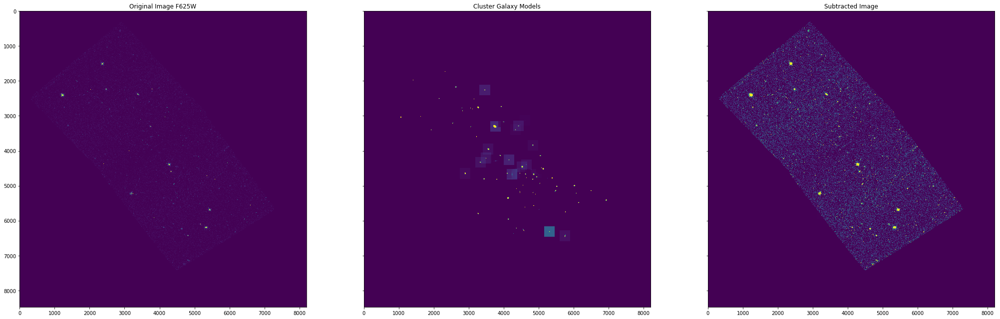

In [5]:
filters = ['F625W']#,'F775W','F814W','F850LP']
for filter in filters:
    originalimage = get_pkg_data_filename('/data1/rowland/elgordo_{}.fits'.format(filter))
    original_image_data = pyfits.getdata(originalimage)
    emptyfield = get_pkg_data_filename('/data1/rowland/models_elgordo{}'.format(filter))
    emptyfields = pyfits.getdata(emptyfield)
    backgrounds = get_pkg_data_filename('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))
    background = pyfits.getdata(backgrounds)
    f, (ax1,ax2,ax3) = mpl.subplots(1,3,sharey=True,figsize=(35,35))
    ax1.imshow(original_image_data,vmin=0,vmax=0.15) #elgordo
    ax1.title.set_text('Original Image {}'.format(filter))
    ax2.imshow(emptyfields,vmin=0,vmax=.0015)#subtracted galaxies
    ax2.title.set_text('Cluster Galaxy Models')
    ax3.imshow(background,vmin=0,vmax=0.02)#residuals
    ax3.title.set_text('Subtracted Image')
    

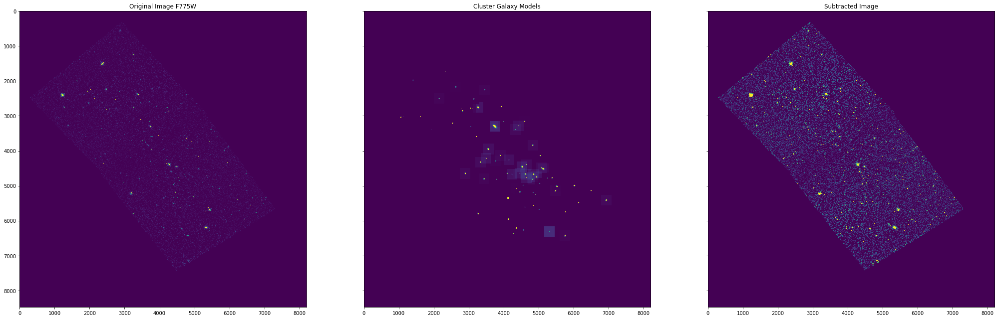

In [12]:
filters = ['F775W']#,'F814W','F850LP']
for filter in filters:
    originalimage = get_pkg_data_filename('/data1/rowland/elgordo_{}.fits'.format(filter))
    original_image_data = pyfits.getdata(originalimage)
    emptyfield = get_pkg_data_filename('/data1/rowland/models_elgordo{}'.format(filter))
    emptyfields = pyfits.getdata(emptyfield)
    backgrounds = get_pkg_data_filename('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))
    background = pyfits.getdata(backgrounds)
    f, (ax1,ax2,ax3) = mpl.subplots(1,3,sharey=True,figsize=(35,35))
    ax1.imshow(original_image_data,vmin=0,vmax=0.1) #elgordo
    ax1.title.set_text('Original Image {}'.format(filter))
    ax2.imshow(emptyfields,vmin=0,vmax=.004)#subtracted galaxies
    ax2.title.set_text('Cluster Galaxy Models')
    ax3.imshow(background,vmin=0,vmax=.02)#residuals
    ax3.title.set_text('Subtracted Image')

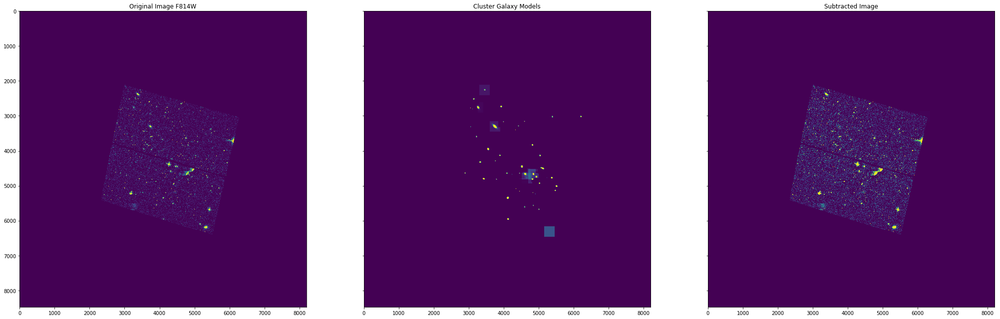

In [13]:
filters = ['F814W']#,'F850LP']
for filter in filters:
    originalimage = get_pkg_data_filename('/data1/rowland/elgordo_{}.fits'.format(filter))
    original_image_data = pyfits.getdata(originalimage)
    emptyfield = get_pkg_data_filename('/data1/rowland/models_elgordo{}'.format(filter))
    emptyfields = pyfits.getdata(emptyfield)
    backgrounds = get_pkg_data_filename('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))
    background = pyfits.getdata(backgrounds)
    f, (ax1,ax2,ax3) = mpl.subplots(1,3,sharey=True,figsize=(35,35))
    ax1.imshow(original_image_data,vmin=0,vmax=0.08) #elgordo
    ax1.title.set_text('Original Image {}'.format(filter))
    ax2.imshow(emptyfields,vmin=0,vmax=.006)#subtracted galaxies
    ax2.title.set_text('Cluster Galaxy Models')
    ax3.imshow(background,vmin=0,vmax=.04)#residuals
    ax3.title.set_text('Subtracted Image')

# Showing a single subtraction

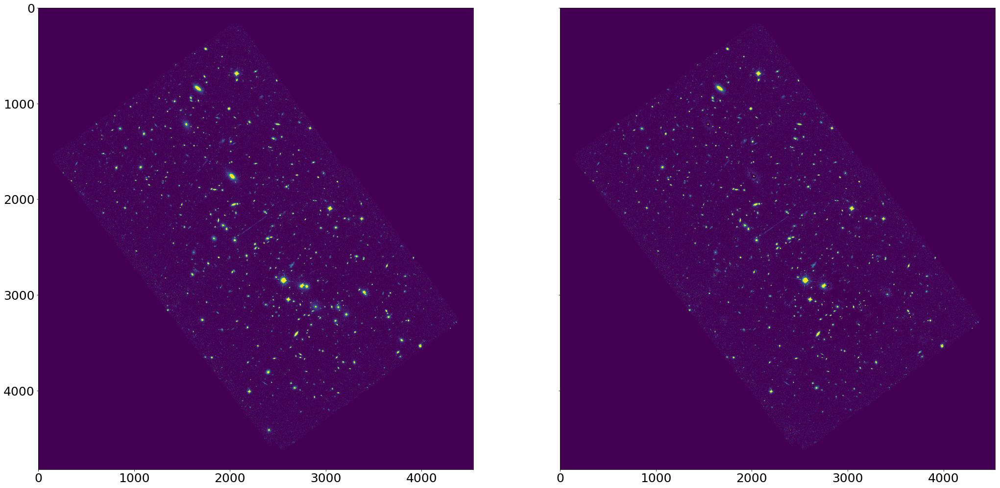

In [13]:
filters = ['F105W']
for filter in filters:
    originalimage = get_pkg_data_filename('/data1/rowland/elgordo_{}.fits'.format(filter))
    original_image_data = pyfits.getdata(originalimage)
    emptyfield = get_pkg_data_filename('/data1/rowland/models_elgordo{}'.format(filter))
    emptyfields = pyfits.getdata(emptyfield)
    backgrounds = get_pkg_data_filename('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))
    background = pyfits.getdata(backgrounds)
    mpl.rcParams.update({'font.size': 25})

    f, (ax1,ax2) = mpl.subplots(1,2,sharey=True,figsize=(35,35))
    ax1.imshow(original_image_data,vmin=0,vmax=0.2) #elgordo
    #ax1.title.set_text('Original')
    #ax2.imshow(emptyfields[filter],vmin=0,vmax=0.2)#subtracted galaxies
    #ax2.imshow(np.flip(emptyfields[filter],axis=1),vmin=0,vmax=0.2)
    #ax2.title.set_text('Second image/ FitModels')
    ax2.imshow(background,vmin=0,vmax=0.2)#residuals
#     ax2.title.set_text('Subtracted data')

#     ax1.set_ylim(2500,3500)
#     ax2.set_ylim(2500,3500)
#     ax1.set_xlim(2500,3500)
#     ax2.set_xlim(2500,3500)
    #mpl.savefig('/data1/rowland/Figures/imperfect_subtractionsEX',overwrite=True)
    #mpl.savefig('/data1/rowland/Figures/beforeAfterEX',overwrite=True)

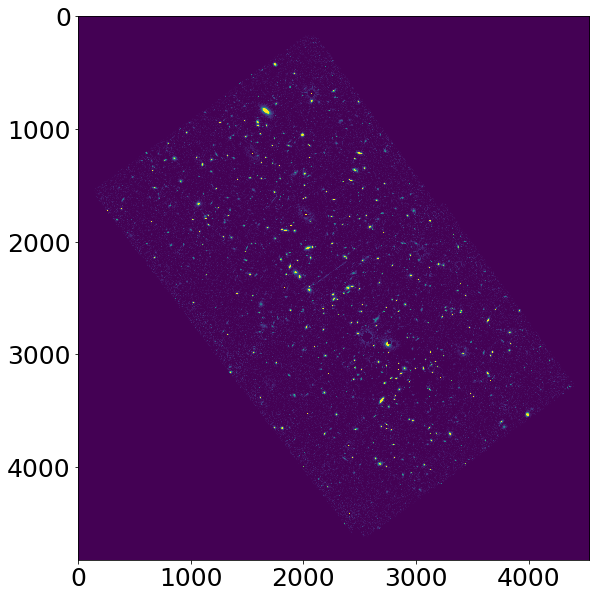

In [17]:
#includes STAR Mask



testfilter = 'F105W' 
B1 = .5 
B2 = 2

SE_tableTEST = ascii.read('/data1/rowland/testPSF_{}.cat'.format(testfilter))
SE_TESTshort1=SE_tableTEST[np.where(SE_tableTEST["MU_MAX"] < (SE_tableTEST["MAG_AUTO"]-B1))]
SE_TESTshort2=SE_TESTshort1[np.where(SE_TESTshort1["MU_MAX"] > (SE_TESTshort1["MAG_AUTO"]-B2))]
SE_TESTshort = SE_TESTshort2[np.where(SE_TESTshort2['MAG_AUTO']<20)]

collected_regions = []
index_list = []
segmapoutputTEST, starmaskTEST = create_mask(testfilter,SE_TESTshort)

elgordoTEST = pyfits.open('/run/media/rowland/PURPLEDRIVE/elgordo_{}.fits'.format(testfilter))[0].data
modelmaskTEST = pyfits.getdata('/data1/rowland/models_elgordo{}'.format(testfilter))#.data
modelsandstarsTEST = starmaskTEST + modelmaskTEST
subtractedelgordoTEST = elgordoTEST - modelsandstarsTEST

mpl.figure(figsize=(10,10))
mpl.imshow(subtractedelgordoTEST,vmin=0,vmax=0.2)
#mpl.savefig('/data1/rowland/Figures/modelsandstarssubt_elgordo{}'.format(testfilter),overwrite =True)

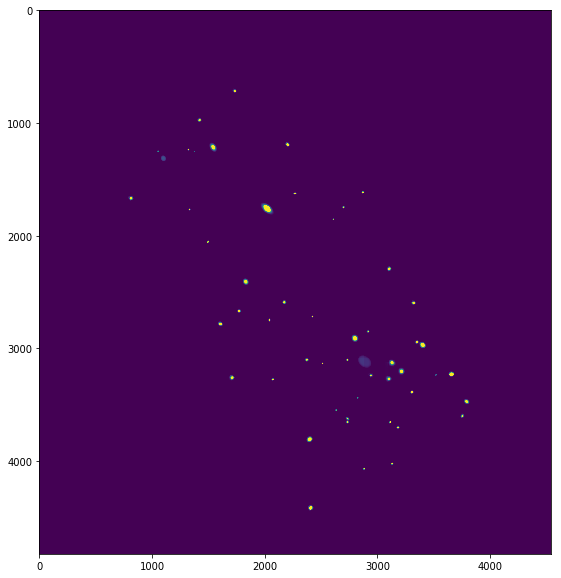

In [8]:
#single filter model cluster

filters = ['F105W']


for filter in filters:
    emptyfield = get_pkg_data_filename('/data1/rowland/models_elgordo{}'.format(filter))
    emptyfields = pyfits.getdata(emptyfield)
    mpl.figure(figsize=(10,10))
    mpl.imshow(emptyfields,vmin=0.01,vmax=.1)
    #mpl.savefig('/data1/rowland/Figures/F105Wmodels',overwrite=True)